# EDA

**Notebook Setup**

In [1]:
import sys
sys.path.append("../src")

%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math391 import config, plotting

In [3]:
df = pd.read_csv("../data/initial_custody.csv", encoding=config.ENCODING)

## Race

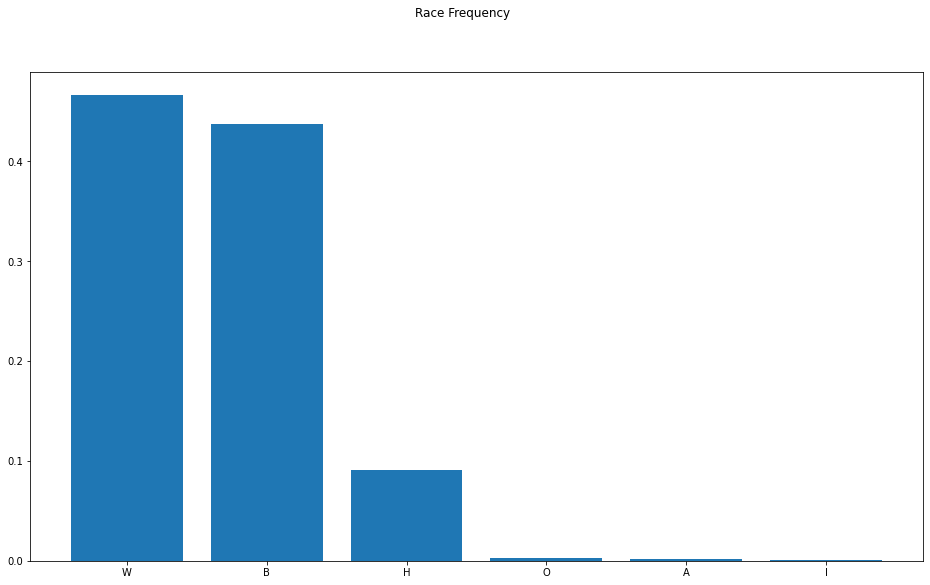

In [4]:
plotting.series_plot(df.race, normalize=True, title="Race Frequency")

## Distribution of Race by Custody Level

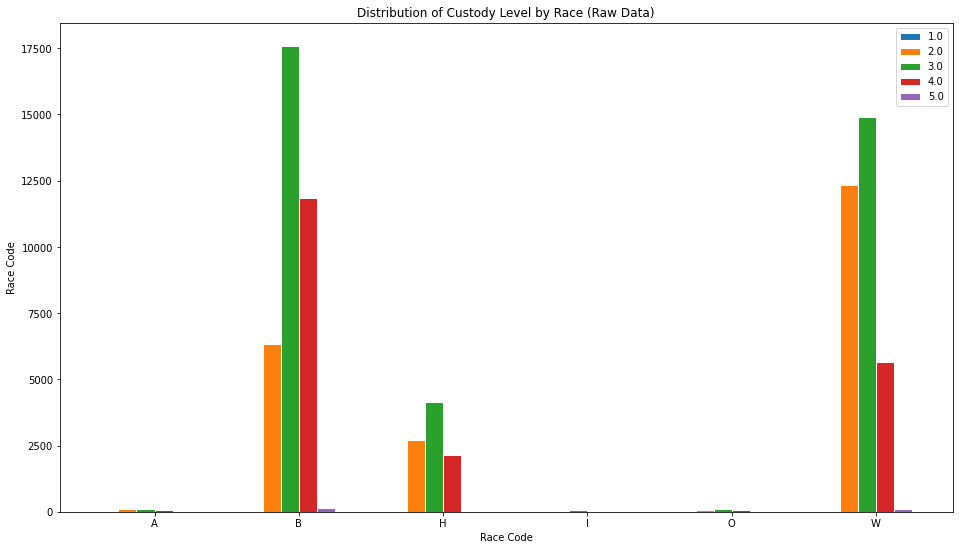

In [5]:
plotting.crosstab_plot(
    pd.crosstab(df.ic_custdy_level, df.race),
    title="Distribution of Custody Level by Race (Raw Data)",
    axis=("Race Code", "Frequency")
)

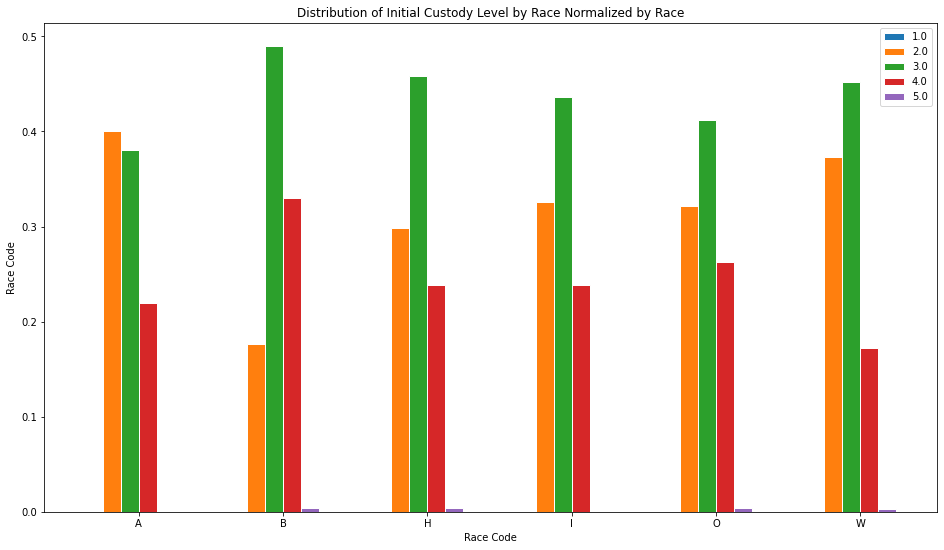

In [6]:
plotting.crosstab_plot(
    pd.crosstab(df.ic_custdy_level, df.race, normalize="columns"),
    title="Distribution of Initial Custody Level by Race Normalized by Race",
    axis=("Race Code", "Frequency")
)

## Justing Looking at White and Black Inmates

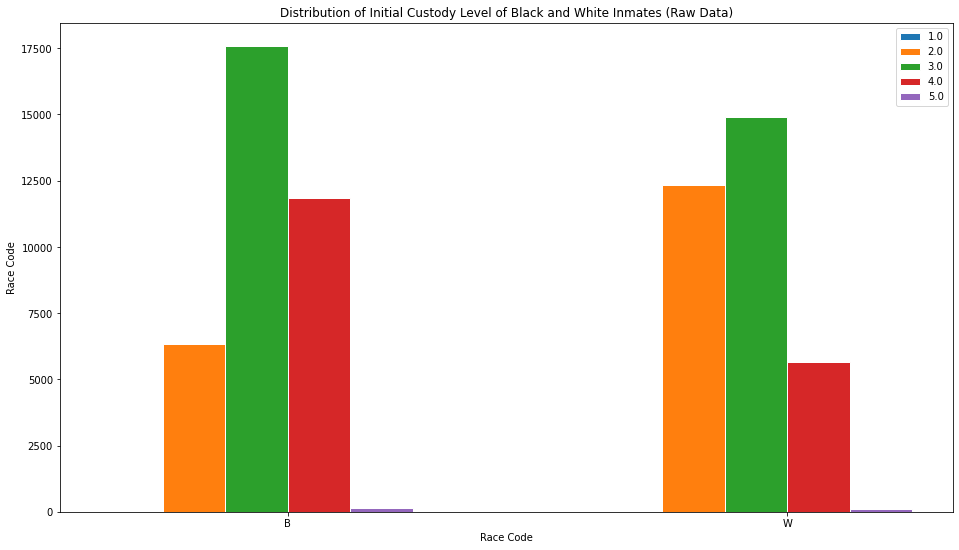

In [7]:
plotting.crosstab_plot(
    pd.crosstab(
        df.ic_custdy_level,
        df.race.apply(lambda x: x if (x == "W" or x == "B") else np.nan)
    ),
    title="Distribution of Initial Custody Level of Black and White Inmates (Raw Data)",
    axis=("Race Code", "Frequency")
)

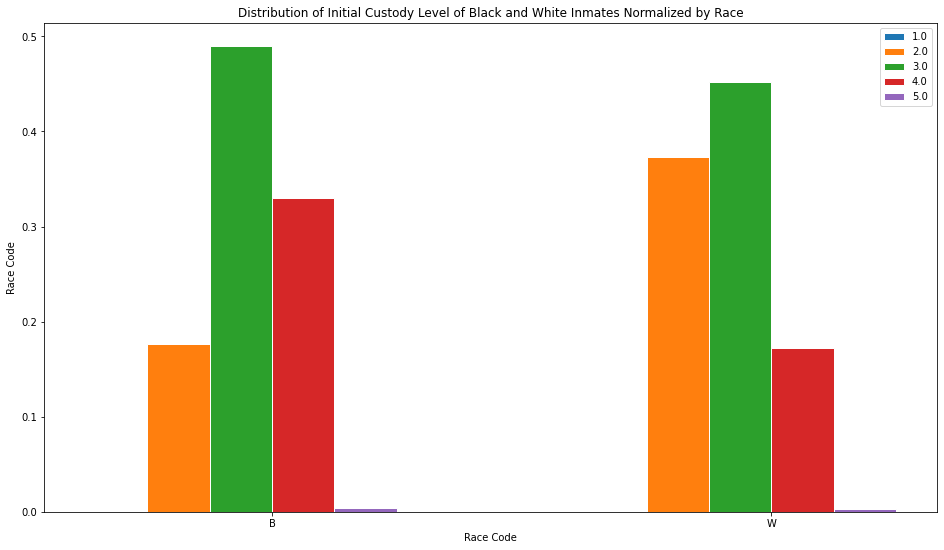

In [8]:
plotting.crosstab_plot(
    pd.crosstab(
        df.ic_custdy_level,
        df.race.apply(lambda x: x if (x == "W" or x == "B") else np.nan),
        normalize="columns"
    ),
    title="Distribution of Initial Custody Level of Black and White Inmates Normalized by Race",
    axis=("Race Code", "Frequency")
)

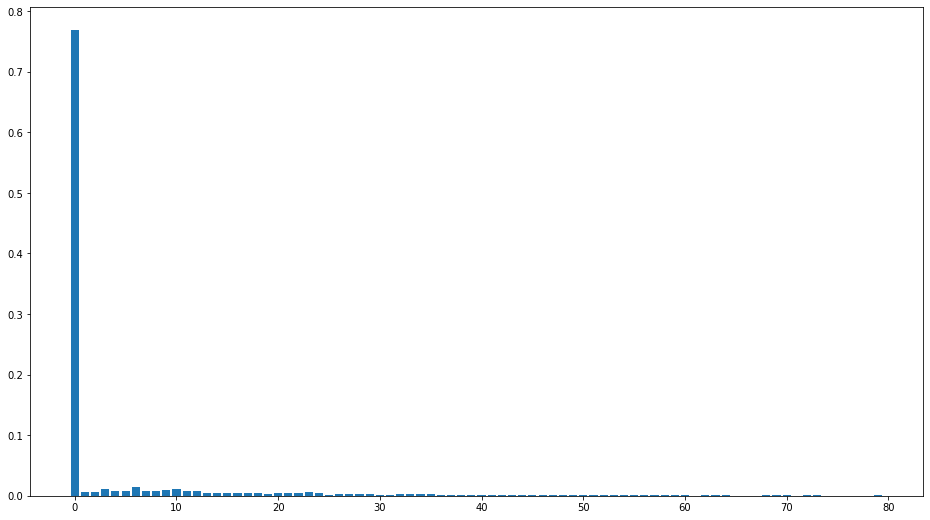

In [9]:
plotting.series_plot(df.ic_mths_to_release.apply(lambda x: x if x < 80 else np.nan), normalize=True)

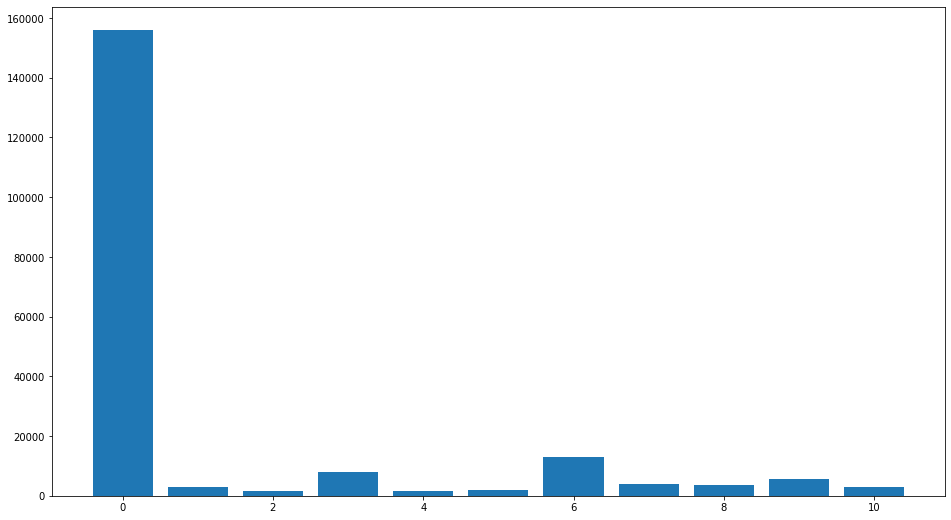

In [10]:
plotting.series_plot(df.ic_da_score)

In [11]:
black_inmates = df[df.race == "B"]
white_inmates = df[df.race == "W"]

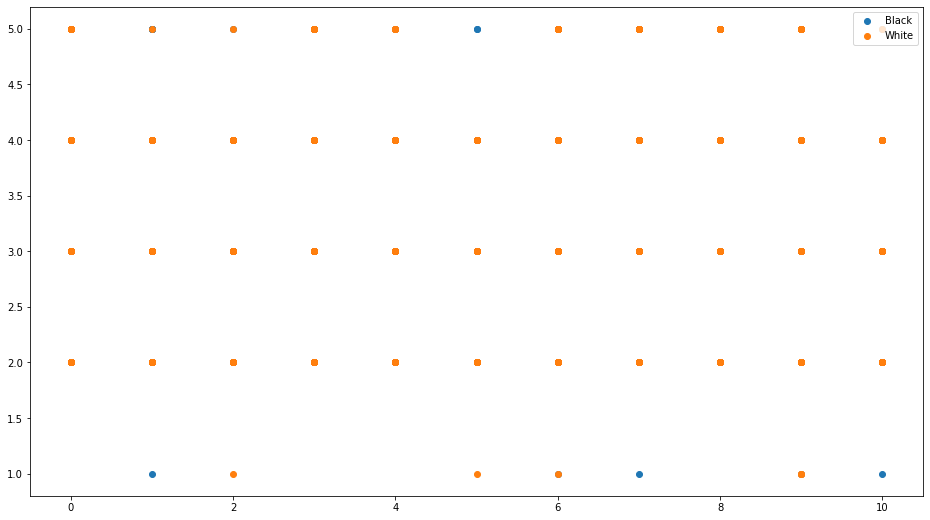

In [12]:
plotting.multi_scatter_plot(
    [black_inmates.ic_da_score, white_inmates.ic_da_score],
    [black_inmates.ic_custdy_level, white_inmates.ic_custdy_level],
    ["Black", "White"]
)

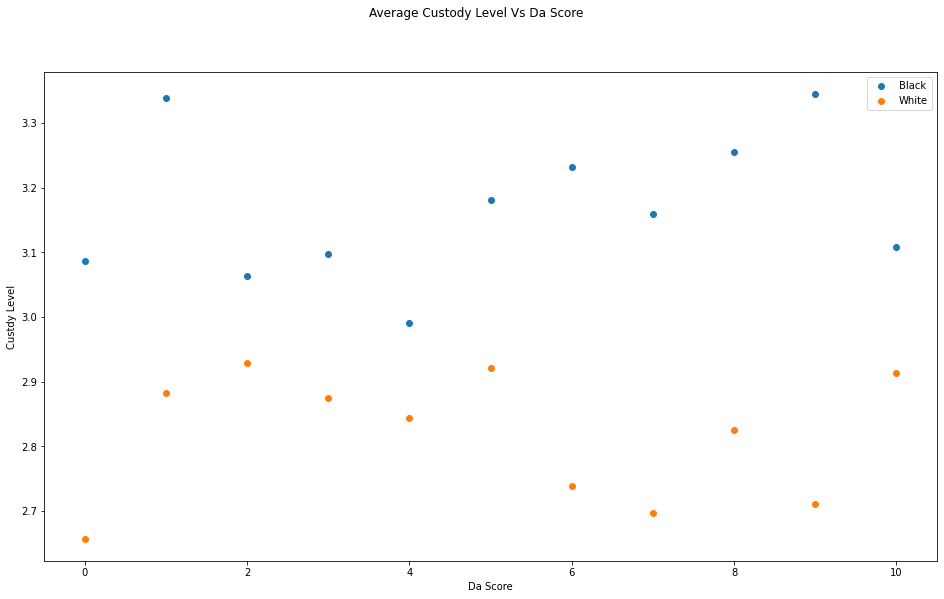

In [13]:
plotting.multi_scatter_plot(
    [black_inmates.ic_da_score.dropna().unique(), white_inmates.ic_da_score.dropna().unique()],
    [black_inmates.groupby("ic_da_score")["ic_custdy_level"].mean(), white_inmates.groupby("ic_da_score")["ic_custdy_level"].mean()],
    ["Black", "White"],
    title="Average Custody Level Vs Da Score",
    axis=("Da Score", "Custdy Level")
)

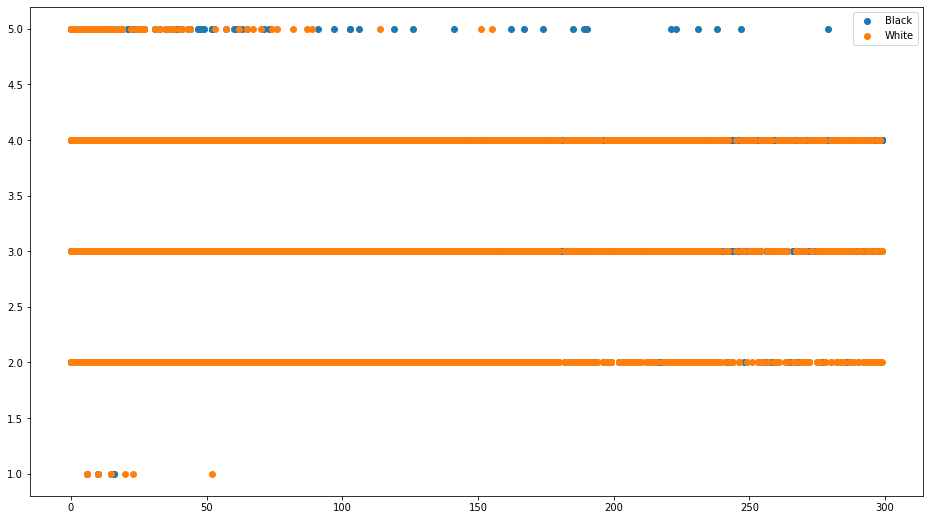

In [14]:
plotting.multi_scatter_plot(
    [
        black_inmates.ic_mths_to_release.apply(lambda x: x if x < 300 else np.nan),
        white_inmates.ic_mths_to_release.apply(lambda x: x if x < 300 else np.nan)
    ],
    [
        black_inmates["ic_custdy_level"],
        white_inmates["ic_custdy_level"]
    ],
    ["Black", "White"]
)

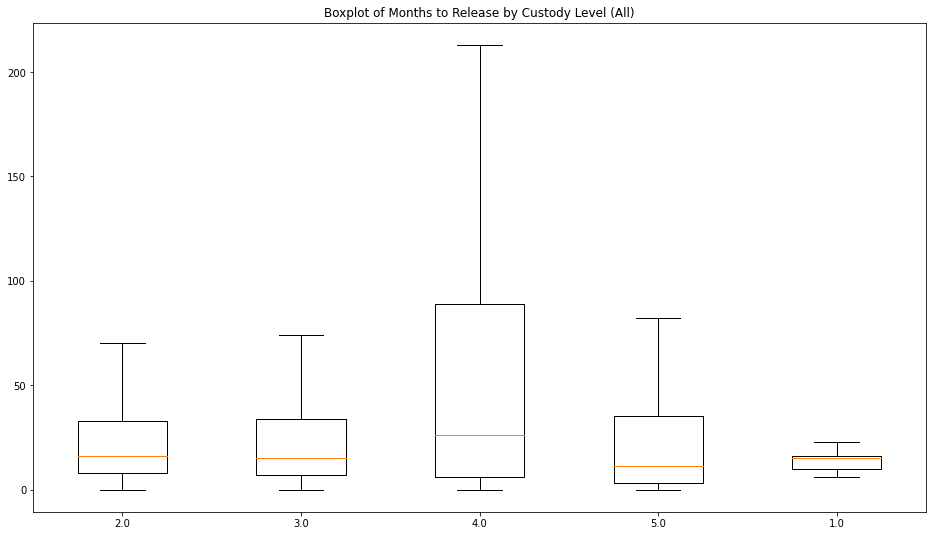

In [50]:
def boxplot_by_cust_lvl_and_mnths_release():
    grp_cust = df.groupby("ic_custdy_level")
    values = []
    names = []
    _, ax = plt.subplots(1, 1, figsize=(16, 9))

    for cust_lvl in df.ic_custdy_level.unique():
        if np.isnan(cust_lvl):
            continue
        values.append(grp_cust[["ic_mths_to_release"]].get_group(cust_lvl).values.flatten())
        names.append(cust_lvl)
    
    ax.boxplot(values, showfliers=False)
    ax.set_xticklabels(names)
    ax.set_title("Boxplot of Months to Release by Custody Level (All)")

boxplot_by_cust_lvl_and_mnths_release()
    

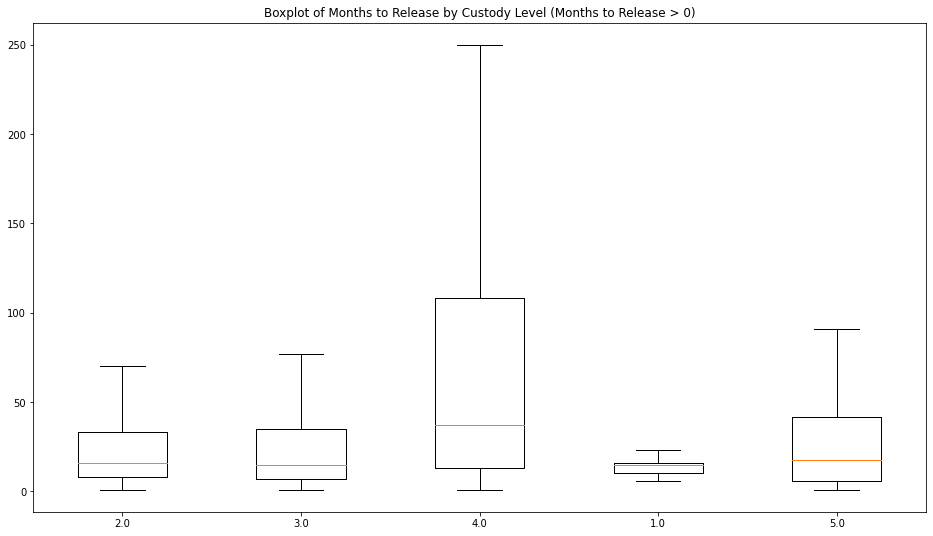

In [49]:
def boxplot_by_cust_lvl_and_mnths_release_gt_0():
    df = pd.read_csv("../data/initial_custody_unreleased.csv")
    grp_cust = df.groupby("ic_custdy_level")
    values = []
    names = []
    _, ax = plt.subplots(1, 1, figsize=(16, 9))

    for cust_lvl in df.ic_custdy_level.unique():
        if np.isnan(cust_lvl):
            continue
        values.append(grp_cust[["ic_mths_to_release"]].get_group(cust_lvl).values.flatten())
        names.append(cust_lvl)
    
    ax.boxplot(values, showfliers=False)
    ax.set_xticklabels(names)
    ax.set_title("Boxplot of Months to Release by Custody Level (Months to Release > 0)")

boxplot_by_cust_lvl_and_mnths_release_gt_0()